# Accessing HUD Location Affordability Data by Census Tract

**About the data**

The US department of Housing and Urban Development periodically creates the Location Affordability Index which utilizes various government data sources and statistical modeling and analysis to create a dataset listing useful information about income, cost of housing and cost of transportation broken down by census tract. See the link below for more information about the data and methodology.

Note: for a more detailed report and some additional features see the Monroe county version of the this project.

In [1]:
# Import modules
import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gpd
from census import Census
from us import states
import os
import warnings
warnings.filterwarnings('ignore')

## 1. Import HUD geojson data file

This data source was available via download at the URL listed below. The version of the index used for this project was v3 which was released in 2019 and is based in part on the 2016 American Community Survey 5 year estimates. This dataset contains geographic data along with many feature columns. We will only use the columns listed below for this project.

In [2]:
# Dataset downloadable from (filtered for IN only) : https://hudgis-hud.opendata.arcgis.com/datasets/location-affordability-index-v-3/explore?location=14.179009%2C0.315564%2C2.33
# for data and methodology info: https://files.hudexchange.info/resources/documents/Location-Affordability-Index-Version-3-Data-and-Methodology.pdf

data = gpd.read_file("Location_Affordability_Index_v.3.geojson")  
data.crs
print(type(data))


<class 'geopandas.geodataframe.GeoDataFrame'>


In [3]:
# for FIPS code info: https://en.wikipedia.org/wiki/Federal_Information_Processing_Standard_state_code
# Indiana state code: 18, Monroe county: 105
def state_data(state_fips):
    subdata = data.loc[data['STATE']== state_fips]
    subdata = subdata[['OBJECTID','GEOID','STATE','COUNTY','TRACT','owner_occupied_hu' , 'renter_occupied_hu', 'pct_renter_occupied_hu', 'median_smoc_mortgage', 'median_gross_rent','median_hh_income','area_median_hh_income','job_density_simple','job_gravity','SHAPE_Length','SHAPE_Area','geometry']]
    return subdata

subdata = state_data('18')

#create county df for columns we want
def county_data(county_fips):
    county_data = data.loc[data['COUNTY']== county_fips]
    county_data = county_data[['OBJECTID','GEOID','STATE','COUNTY','TRACT','owner_occupied_hu' , 'renter_occupied_hu', 'pct_renter_occupied_hu', 'median_smoc_mortgage', 'median_gross_rent','median_hh_income','area_median_hh_income','job_density_simple','job_gravity','SHAPE_Length','SHAPE_Area','geometry']]
    return county_data

monroe_df = county_data('105')

## 2. Create new columns for monthly income and remaining income

To illustrate the idea of average disposable income we will create new columns for median income per month and amount of income remaining after the cost of housing for renters and homeowners.

In [4]:
# create a new column for remaining income owners (ri_own) and renters (ri_rent). First creating a variable for median hh income per month.
def ri_df(df_input):
    df_input['med_inc_month'] = (df_input['median_hh_income']/12).round(2)
    df_input['ri_own'] = df_input['med_inc_month'] - df_input['median_smoc_mortgage']
    df_input['ri_rent'] = df_input['med_inc_month'] - df_input['median_gross_rent']

    return df_input

In [5]:
subdata = ri_df(subdata)
for column in subdata:
    print(column)

OBJECTID
GEOID
STATE
COUNTY
TRACT
owner_occupied_hu
renter_occupied_hu
pct_renter_occupied_hu
median_smoc_mortgage
median_gross_rent
median_hh_income
area_median_hh_income
job_density_simple
job_gravity
SHAPE_Length
SHAPE_Area
geometry
med_inc_month
ri_own
ri_rent


In [6]:
subdata.head()

,OBJECTID,GEOID,STATE,COUNTY,TRACT,owner_occupied_hu,renter_occupied_hu,pct_renter_occupied_hu,median_smoc_mortgage,median_gross_rent,median_hh_income,area_median_hh_income,job_density_simple,job_gravity,SHAPE_Length,SHAPE_Area,geometry,med_inc_month,ri_own,ri_rent
0,23402,18073100800,18,073,100800,1420.0,303.0,17.585607,1211.0,735.0,54571.0,63327.0,0.015952,3767.572390,0.917945,0.035554,"MULTIPOLYGON (((-86.93008 41.23680, -86.92977 ...",4547.58,3336.58,3812.58
1,23403,18073101300,18,073,101300,994.0,300.0,23.183926,1070.0,669.0,52667.0,63327.0,0.035552,4725.327608,0.970124,0.034323,"MULTIPOLYGON (((-86.98719 40.88173, -86.98687 ...",4388.92,3318.92,3719.92
2,23404,18097341902,18,097,341902,1123.0,280.0,19.957234,977.0,890.0,55919.0,54261.0,1.257371,28362.850490,0.080094,0.000378,"MULTIPOLYGON (((-86.27045 39.77960, -86.27034 ...",4659.92,3682.92,3769.92
3,23405,18097342101,18,097,342101,1392.0,446.0,24.265506,999.0,801.0,52695.0,54261.0,3.234343,33903.774240,0.116121,0.000512,"MULTIPOLYGON (((-86.26986 39.76113, -86.26983 ...",4391.25,3392.25,3590.25
4,23406,18097341700,18,097,341700,823.0,861.0,51.128266,809.0,690.0,24231.0,54261.0,1.058156,35454.970100,0.109803,0.000633,"MULTIPOLYGON (((-86.21613 39.77844, -86.21606 ...",2019.25,1210.25,1329.25


In [7]:
monroe_df = ri_df(monroe_df)


In [8]:
monroe_df.shape

(31, 20)

## 3. EDA

Let's try to visualize and summarize some fo the data around housing affordability for the state of Indiana as a whole.

In [9]:
for column in subdata:
    print(column)

OBJECTID
GEOID
STATE
COUNTY
TRACT
owner_occupied_hu
renter_occupied_hu
pct_renter_occupied_hu
median_smoc_mortgage
median_gross_rent
median_hh_income
area_median_hh_income
job_density_simple
job_gravity
SHAPE_Length
SHAPE_Area
geometry
med_inc_month
ri_own
ri_rent


In [10]:
sub_num = subdata[['owner_occupied_hu','renter_occupied_hu','pct_renter_occupied_hu','median_smoc_mortgage','median_gross_rent','median_hh_income','area_median_hh_income','job_density_simple','job_gravity','med_inc_month','ri_own','ri_rent']]
sub_num.describe()

,owner_occupied_hu,renter_occupied_hu,pct_renter_occupied_hu,median_smoc_mortgage,median_gross_rent,median_hh_income,area_median_hh_income,job_density_simple,job_gravity,med_inc_month,ri_own,ri_rent
count,1505.000000,1505.000000,1505.000000,1489.000000,1486.000000,1501.000000,1505.000000,1505.000000,1505.000000,1501.000000,1489.000000,1485.000000
mean,1147.847841,522.469767,33.121320,1046.919409,776.600942,49814.747502,51118.652492,1.504968,15413.264655,4151.228901,3124.819496,3343.870316
std,686.485992,396.969145,20.528444,249.878872,193.996582,19513.749315,5984.939509,4.351871,15212.747817,1626.145740,1423.778558,1472.768224
min,0.000000,0.000000,0.000000,558.000000,190.000000,4185.000000,38791.000000,0.000634,1619.212519,348.750000,-1474.080000,-589.080000
25%,676.000000,252.000000,16.696653,880.000000,662.000000,36138.000000,47042.000000,0.049555,4655.943472,3011.500000,2149.670000,2300.580000
50%,1039.000000,429.000000,29.106628,1002.000000,748.000000,48229.000000,50369.000000,0.450784,11215.842990,4019.080000,3005.750000,3268.580000
75%,1474.000000,663.000000,46.070656,1163.000000,851.000000,59904.000000,54261.000000,1.497361,22510.432590,4992.000000,3869.670000,4179.330000
max,5545.000000,3232.000000,100.000000,2592.000000,2054.000000,156596.000000,63327.000000,72.556132,165455.283900,13049.670000,10848.670000,11327.670000


Below we see the number of census tracts that fall under each bucket of disposable income level in Indiana. This could be useful for gauging the state as a whole and determining wether certain areas need attantion to improve affordability. We see in this data that there are a number of tracts where the average income is actually lower than the average cost of housing, indicating that affordability is a serious problem in some areas.

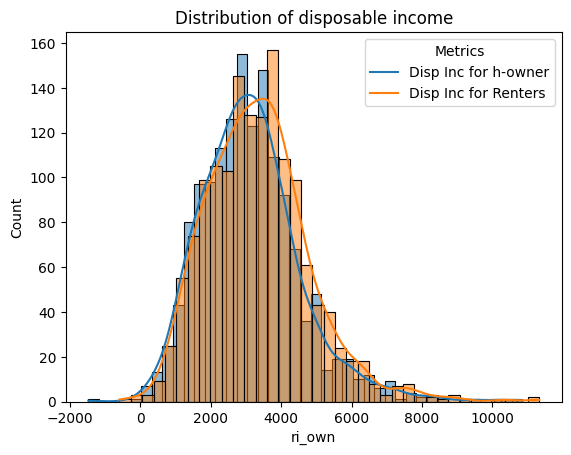

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns

# Example: Histogram
sns.histplot(subdata['ri_own'], kde=True)
sns.histplot(subdata['ri_rent'], kde=True)
plt.title('Distribution of disposable income')
plt.legend(title='Metrics', loc='upper right', labels=['Disp Inc for h-owner', 'Disp Inc for Renters'])
plt.show()

Below we have created a variable of the numeric columns and we can find the correlation between them to look for highly related columns in the data.

In [12]:
sub_num.corr()

,owner_occupied_hu,renter_occupied_hu,pct_renter_occupied_hu,median_smoc_mortgage,median_gross_rent,median_hh_income,area_median_hh_income,job_density_simple,job_gravity,med_inc_month,ri_own,ri_rent
owner_occupied_hu,1.000000,-0.063087,-0.611828,0.494958,0.387970,0.658981,0.098975,-0.244351,-0.315606,0.658981,0.653072,0.667585
renter_occupied_hu,-0.063087,1.000000,0.680315,-0.051988,-0.056356,-0.346063,0.057852,0.284191,0.358405,-0.346062,-0.387270,-0.351260
pct_renter_occupied_hu,-0.611828,0.680315,1.000000,-0.362138,-0.268372,-0.711068,0.030332,0.400060,0.532781,-0.711068,-0.737725,-0.724179
median_smoc_mortgage,0.494958,-0.051988,-0.362138,1.000000,0.578167,0.793476,0.328985,0.069454,0.035732,0.793476,0.723931,0.769314
median_gross_rent,0.387970,-0.056356,-0.268372,0.578167,1.000000,0.604170,0.305250,-0.002316,0.141211,0.604170,0.591912,0.517163
median_hh_income,0.658981,-0.346063,-0.711068,0.793476,0.604170,1.000000,0.171029,-0.198504,-0.230069,1.000000,0.994279,0.994473
area_median_hh_income,0.098975,0.057852,0.030332,0.328985,0.305250,0.171029,1.000000,0.025629,0.227228,0.171029,0.131315,0.149556
job_density_simple,-0.244351,0.284191,0.400060,0.069454,-0.002316,-0.198504,0.025629,1.000000,0.492924,-0.198504,-0.222048,-0.213011
job_gravity,-0.315606,0.358405,0.532781,0.035732,0.141211,-0.230069,0.227228,0.492924,1.000000,-0.230069,-0.259536,-0.269265
med_inc_month,0.658981,-0.346062,-0.711068,0.793476,0.604170,1.000000,0.171029,-0.198504,-0.230069,1.000000,0.994279,0.994473


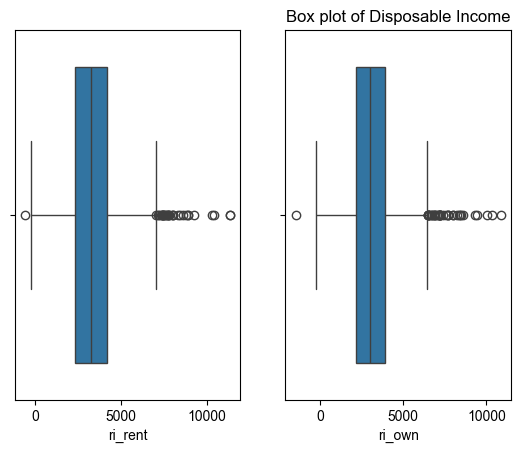

In [13]:
f, axes = plt.subplots(1, 2)
sns.set(rc={'figure.figsize':(10,20)})
sns.boxplot(x=subdata['ri_rent'], ax=axes[0])
sns.boxplot(x=subdata['ri_own'], ax=axes[1])
plt.title('Box plot of Disposable Income')
plt.show()

## 4. Visualizing the map of disposable income based on median income minus median housing costs for the state of Indiana

In [14]:
# Create a map visualization with Plotly for state of IN
import plotly.express as px
fig = px.choropleth(subdata, 
    geojson=subdata.geometry,
    locations=subdata.index, 
    color='ri_own',
    range_color=(0, 7000),
    color_continuous_scale="Viridis",
    labels={'ri_own':'Disposable Income'},
    title='Disposable Income for homeowners in Indiana'
)
fig.update_layout(height=1000, margin={"r":5,"t":35,"l":5,"b":5})

# Improve the legend
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(coloraxis_colorbar=dict(
    thicknessmode="pixels", thickness=10,
    lenmode="pixels", len=150,
    yanchor="top", y=0.8,
    ticks="outside",
    dtick=1000
))

fig.show()

In [15]:
# Create a map visualization with Plotly for state of IN Renters
import plotly.express as px
fig = px.choropleth(subdata, 
    geojson=subdata.geometry,
    locations=subdata.index, 
    color='ri_rent',
    range_color=(0, 7000),
    color_continuous_scale="Viridis",
    labels={'ri_rent':'Disposable Income'},
    title='Disposable Income for Renters in Indiana'
)
fig.update_layout(height=1000, margin={"r":5,"t":35,"l":5,"b":5})

# Improve the legend
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(coloraxis_colorbar=dict(
    thicknessmode="pixels", thickness=10,
    lenmode="pixels", len=150,
    yanchor="top", y=0.8,
    ticks="outside",
    dtick=1000
))

fig.show()

## Visualizing the map of disposable income based on median income minus median housing costs for individual County Indiana


In [16]:
# create plotly map visual for Monroe county
import plotly.express as px
fig = px.choropleth(monroe_df, 
    geojson=monroe_df.geometry,
    locations=monroe_df.index, 
    color='ri_own',
    range_color=(0, 7000),
    color_continuous_scale="Viridis",
    labels={'ri_own':'Disposable Income'},
    title='Disposable Income for homeowners in Monroe County'
)
fig.update_layout(margin={"r":5,"t":35,"l":5,"b":5})

# Improve the legend
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(coloraxis_colorbar=dict(
    thicknessmode="pixels", thickness=10,
    lenmode="pixels", len=150,
    yanchor="top", y=0.8,
    ticks="outside",
    dtick=1000
))

fig.show()

In [17]:
# create plotly map visual for Monroe county renters
import plotly.express as px
fig = px.choropleth(monroe_df, 
    geojson=monroe_df.geometry,
    locations=monroe_df.index, 
    color='ri_rent',
    range_color=(0, 7000),
    color_continuous_scale="Viridis",
    labels={'ri_rent':'Disposable Income'},
    title='Disposable Income for Renters in Monroe County'
)
fig.update_layout(margin={"r":5,"t":35,"l":5,"b":5})

# Improve the legend
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(coloraxis_colorbar=dict(
    thicknessmode="pixels", thickness=10,
    lenmode="pixels", len=150,
    yanchor="top", y=0.8,
    ticks="outside",
    dtick=1000
))

fig.show()

## Data output and data dictionaries for this project

In [18]:
#Reference HUD Location Affordability index data and methodology: https://files.hudexchange.info/resources/documents/Location-Affordability-Index-Version-3-Data-and-Methodology.pdf
#data distionary template:

# Customize for data in this project
columns = subdata.columns
data_types = subdata.dtypes
descriptions = columns
description_lst = [' Unique Identifier for each row in the location affordability dataset',
                   ' combination of state id number, county id number, and census track number',
                   ' state id number',
                   ' county id number',
                   ' census tract id number',
                   ' number of owner occupied housing units in this tract',
                   ' number of renter occupied housing units in this tract',
                   ' Percent of households in renter-occupied housing units',
                   ' Median selected monthly ownership costs for homeowners',
                   ' Median Gross Rent',
                   ' Median household income for census tract',
                   ' Regional median household income for county',
                   ' Jobs per land acre simple',
                   ' Total jobs for every tract in the US divided by its distance from the centroid squared',
                   ' shape length',
                   ' shape area',
                   ' geometry of the tract',
                   ' Calculated by tract median income divided by 12',
                   ' remaining income for owners is the monthly median income after cost of mortgage is removed',
                   ' remaining income for renters is the monthly median income after cost of rent is removed']

descriptions = list(map(str.__add__, descriptions, description_lst))

def generate_data_dictionary(column_names, descriptions, data_types):
    data_dictionary = {}

    for column, desc, data_type in zip(column_names, descriptions, data_types):
        data_dictionary[column] = {
            'Description': desc,
            'DataType': data_type,

        }

    return data_dictionary

data_dictionary = generate_data_dictionary(columns, descriptions, data_types)
IN_disposable_inc_dd = data_dictionary
IN_disposable_inc_dd

{'OBJECTID': {'Description': 'OBJECTID Unique Identifier for each row in the location affordability dataset',
  'DataType': dtype('int64')},
 'GEOID': {'Description': 'GEOID combination of state id number, county id number, and census track number',
  'DataType': dtype('O')},
 'STATE': {'Description': 'STATE state id number', 'DataType': dtype('O')},
 'COUNTY': {'Description': 'COUNTY county id number', 'DataType': dtype('O')},
 'TRACT': {'Description': 'TRACT census tract id number',
  'DataType': dtype('O')},
 'owner_occupied_hu': {'Description': 'owner_occupied_hu number of owner occupied housing units in this tract',
  'DataType': dtype('float64')},
 'renter_occupied_hu': {'Description': 'renter_occupied_hu number of renter occupied housing units in this tract',
  'DataType': dtype('float64')},
 'pct_renter_occupied_hu': {'Description': 'pct_renter_occupied_hu Percent of households in renter-occupied housing units',
  'DataType': dtype('float64')},
 'median_smoc_mortgage': {'Descri

In [31]:
#Export data files to CSV

subdata.to_csv(r'./hud_loc_afrd_in.csv', index = False)

in_dd_df = pd.DataFrame.from_dict(IN_disposable_inc_dd) 
in_dd_df.to_csv(r'./in_hud_datadesc.csv', index = False)